In [2]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

#import os
#for dirname, _, filenames in os.walk('/kaggle/input'):
#    for filename in filenames:
#        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Import Libraries 

In [3]:
data=pd.read_csv("weatherAUS_train.csv")
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2013-07-22,Sydney,8.7,17.2,0.0,3.8,9.9,WNW,54.0,WNW,...,54.0,28.0,1019.4,1016.3,2.0,2.0,12.2,16.6,No,0
1,2015-02-28,Sale,15.4,25.7,0.0,NaN,NaN,W,67.0,NNE,...,84.0,66.0,1008.1,1005.1,8.0,8.0,18.8,24.3,No,1
2,2009-11-18,PerthAirport,15.2,22.2,7.2,5.2,3.3,NW,78.0,NW,...,68.0,91.0,1001.5,1000.1,7.0,8.0,20.1,16.5,Yes,1
3,2014-02-19,Richmond,19.9,26.4,0.0,2.8,NaN,SW,24.0,NNE,...,97.0,97.0,1004.6,1002.1,NaN,NaN,22.6,22.3,No,1
4,2015-10-04,Wollongong,19.3,32.9,0.0,NaN,NaN,W,48.0,NNW,...,46.0,15.0,1022.8,1020.7,NaN,NaN,22.1,32.6,No,0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101822 entries, 0 to 101821
Data columns (total 23 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Date           101822 non-null  object 
 1   Location       101822 non-null  object 
 2   MinTemp        100795 non-null  float64
 3   MaxTemp        100947 non-null  float64
 4   Rainfall       99522 non-null   float64
 5   Evaporation    57933 non-null   float64
 6   Sunshine       53022 non-null   float64
 7   WindGustDir    94504 non-null   object 
 8   WindGustSpeed  94550 non-null   float64
 9   WindDir9am     94431 non-null   object 
 10  WindDir3pm     98836 non-null   object 
 11  WindSpeed9am   100550 non-null  float64
 12  WindSpeed3pm   99663 non-null   float64
 13  Humidity9am    99968 non-null   float64
 14  Humidity3pm    98662 non-null   float64
 15  Pressure9am    91268 non-null   float64
 16  Pressure3pm    91304 non-null   float64
 17  Cloud9am       62833 non-null

In [5]:
data.isnull().sum()

Date                 0
Location             0
MinTemp           1027
MaxTemp            875
Rainfall          2300
Evaporation      43889
Sunshine         48800
WindGustDir       7318
WindGustSpeed     7272
WindDir9am        7391
WindDir3pm        2986
WindSpeed9am      1272
WindSpeed3pm      2159
Humidity9am       1854
Humidity3pm       3160
Pressure9am      10554
Pressure3pm      10518
Cloud9am         38989
Cloud3pm         41420
Temp9am           1226
Temp3pm           2518
RainToday         2300
RainTomorrow         0
dtype: int64

* There are some missing values in RainToday and RainTomorrow columns which is not good practice
* target feature should not have null values

In [6]:
data.dropna(subset=['RainToday', 'RainTomorrow'], inplace=True)

In [7]:
data.isnull().sum()

Date                 0
Location             0
MinTemp            331
MaxTemp            331
Rainfall             0
Evaporation      42244
Sunshine         47354
WindGustDir       6897
WindGustSpeed     6853
WindDir9am        6839
WindDir3pm        2692
WindSpeed9am       792
WindSpeed3pm      1874
Humidity9am       1083
Humidity3pm       2559
Pressure9am       9768
Pressure3pm       9798
Cloud9am         37178
Cloud3pm         39669
Temp9am            469
Temp3pm           1928
RainToday            0
RainTomorrow         0
dtype: int64

In [8]:
data['Date'].isnull().sum()

0

* Converted the Date column in Datetime format 

In [9]:
data['Date']=pd.to_datetime(data['Date'])

## Will Seperate Numerical Columns and Categorical columns to treat them seperatly 

In [10]:
numeric_col=data.select_dtypes(include=np.number).columns.tolist()

In [11]:
cate_col=data.select_dtypes(include='object').columns.tolist()

In [12]:
print(numeric_col)
print("-"*50)
print(cate_col)

['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'RainTomorrow']
--------------------------------------------------
['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday']


# DataBackup


# will treat first on Category data null values as there are less work

In [13]:
data[cate_col].isnull().sum()

Location          0
WindGustDir    6897
WindDir9am     6839
WindDir3pm     2692
RainToday         0
dtype: int64

In [14]:
for col in data[cate_col]:
    print(col)
    print("-"*50)
    print(data[col].value_counts())

Location
--------------------------------------------------
Canberra            2420
Sydney              2336
Darwin              2250
Perth               2240
Hobart              2229
Brisbane            2203
MountGambier        2160
Launceston          2152
Ballarat            2151
Albury              2146
Adelaide            2145
Nuriootpa           2133
Townsville          2131
Cairns              2129
MelbourneAirport    2121
SydneyAirport       2115
Albany              2108
Bendigo             2107
WaggaWagga          2104
PerthAirport        2104
Newcastle           2103
Cobar               2100
Woomera             2100
Sale                2096
GoldCoast           2092
AliceSprings        2092
Witchcliffe         2091
SalmonGums          2087
Watsonia            2086
Mildura             2084
Tuggeranong         2084
Portland            2082
Wollongong          2070
CoffsHarbour        2056
Penrith             2048
NorahHead           2044
Dartmoor            2041
NorfolkIsland  

In [15]:
print(data['RainToday'].isnull().sum())
print(data['RainTomorrow'].isnull().sum())

0
0


# we filled null values with unknown 

In [16]:
data[cate_col] = data[cate_col].fillna('Unknown')

In [17]:
data[cate_col].isnull().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
RainToday      0
dtype: int64

In [18]:
data[numeric_col].head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
0,8.7,17.2,0.0,3.8,9.9,54.0,17.0,26.0,54.0,28.0,1019.4,1016.3,2.0,2.0,12.2,16.6,0
1,15.4,25.7,0.0,NaN,NaN,67.0,11.0,9.0,84.0,66.0,1008.1,1005.1,8.0,8.0,18.8,24.3,1
2,15.2,22.2,7.2,5.2,3.3,78.0,33.0,28.0,68.0,91.0,1001.5,1000.1,7.0,8.0,20.1,16.5,1
3,19.9,26.4,0.0,2.8,NaN,24.0,13.0,9.0,97.0,97.0,1004.6,1002.1,NaN,NaN,22.6,22.3,1
4,19.3,32.9,0.0,NaN,NaN,48.0,19.0,22.0,46.0,15.0,1022.8,1020.7,NaN,NaN,22.1,32.6,0


In [19]:
data[numeric_col].isnull().sum()

MinTemp            331
MaxTemp            331
Rainfall             0
Evaporation      42244
Sunshine         47354
WindGustSpeed     6853
WindSpeed9am       792
WindSpeed3pm      1874
Humidity9am       1083
Humidity3pm       2559
Pressure9am       9768
Pressure3pm       9798
Cloud9am         37178
Cloud3pm         39669
Temp9am            469
Temp3pm           1928
RainTomorrow         0
dtype: int64

In [20]:
data[numeric_col].describe().T

,count,mean,std,min,25%,50%,75%,max
MinTemp,99191.0,12.199198,6.398929,-8.5,7.6,12.0,16.9,31.9
MaxTemp,99191.0,23.229347,7.106653,-4.8,17.9,22.6,28.3,48.1
Rainfall,99522.0,2.340514,8.237333,0.0,0.0,0.0,0.8,367.6
Evaporation,57278.0,5.476364,4.194689,0.0,2.6,4.8,7.4,145.0
Sunshine,52168.0,7.621306,3.768913,0.0,4.9,8.4,10.6,14.3
WindGustSpeed,92669.0,39.993288,13.583258,7.0,31.0,39.0,48.0,135.0
WindSpeed9am,98730.0,14.021098,8.894333,0.0,7.0,13.0,19.0,130.0
WindSpeed3pm,97648.0,18.656655,8.802919,0.0,13.0,19.0,24.0,87.0
Humidity9am,98439.0,68.869310,19.004785,1.0,57.0,70.0,83.0,100.0
Humidity3pm,96963.0,51.485979,20.780205,0.0,37.0,52.0,66.0,100.0


# For Numerical Null values we will use SK learn function impute

In [21]:
from sklearn.impute import SimpleImputer

In [22]:
imputer=SimpleImputer(strategy='mean')

In [23]:
imputer.fit(data[numeric_col])

SimpleImputer()

**After calling the fit, the computed statistics for each column is stored in the statistics_ property of imputer**

In [24]:
imputer_stats=list(imputer.statistics_)
print(imputer_stats)

[12.199197507838411, 23.229347420632923, 2.340513655272201, 5.476364398198261, 7.621306164698666, 39.99328793879291, 14.02109794388737, 18.656654514173358, 68.8693099279757, 51.485979187937666, 1017.6548454664974, 1015.2621108844902, 4.436288977287309, 4.503199505455031, 16.99101592076969, 21.68916121892739, 0.2192279094069653]


In [25]:
imputer.transform(data[numeric_col])

array([[ 8.7       , 17.2       ,  0.        , ..., 12.2       ,
        16.6       ,  0.        ],
       [15.4       , 25.7       ,  0.        , ..., 18.8       ,
        24.3       ,  1.        ],
       [15.2       , 22.2       ,  7.2       , ..., 20.1       ,
        16.5       ,  1.        ],
       ...,
       [13.8       , 17.3       , 96.        , ..., 14.5       ,
        21.68916122,  1.        ],
       [10.5       , 14.6       ,  4.        , ..., 12.2       ,
        13.9       ,  1.        ],
       [ 8.2       , 19.8       ,  0.6       , ..., 16.6       ,
        18.        ,  0.        ]])

In [26]:

data[numeric_col]= imputer.transform(data[numeric_col])

In [27]:

data[numeric_col].isnull().sum()

MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustSpeed    0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainTomorrow     0
dtype: int64

# Data Cleaning is completed 

# Exploratory Data Analysis

**Plotly for EDA**

In [28]:
#!pip install plotly matplotlib seaborn --quiet

In [29]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [30]:

sns.set_style('dark')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = 'White'

In [31]:
px.histogram(data,x='Location', title='Location Vs rainDays', color='RainToday')

* This Graph shows
* RainToday No in Blue Color
* RainToday Yes in Red Color
* Total Count Red and Blue shows the Data rows we have for the perticular city(49 cities)
* From this we have to check how many data we have for RainTomorrow Yes or No (RainTomorrow is our Target Feature)

In [32]:
rainposibilities =data['RainTomorrow'].value_counts()

In [33]:
px.bar(data_frame=rainposibilities, x=rainposibilities.index, y=rainposibilities.values )

In [34]:
paper= plt.figure(figsize=(4,4))
px.pie(data_frame=rainposibilities, names=rainposibilities.index ,values=rainposibilities.values, )

<Figure size 400x400 with 0 Axes>

* we can see 22.2 % Yes RainTomorrow and 77.8% No RainTomorrow

# Backup 1.0

In [35]:
data.to_csv('WeatherUpdated.csv')

backup=pd.DataFrame(data)
backup.sample(5)

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
93755,2012-04-23,AliceSprings,15.8,19.6,15.0,2.400000,0.300000,SW,35.0,S,...,92.0,82.0,1015.9,1015.3,7.000000,7.0000,17.5,18.8,Yes,1.0
58305,2015-05-30,Hobart,7.2,16.2,0.0,2.200000,7.000000,WNW,102.0,NNW,...,53.0,44.0,1002.3,999.4,5.000000,3.0000,13.8,12.1,No,1.0
53755,2011-06-05,NorahHead,10.2,19.2,4.0,5.476364,7.621306,WSW,22.0,W,...,76.0,53.0,1017.9,1013.0,4.436289,4.5032,12.5,17.3,Yes,0.0
48084,2013-05-23,Tuggeranong,3.0,13.3,2.4,5.476364,7.621306,SSE,43.0,S,...,81.0,57.0,1017.0,1017.6,4.436289,4.5032,9.3,12.5,Yes,0.0
23289,2016-02-29,Adelaide,13.8,31.4,0.0,5.476364,7.621306,WSW,26.0,SW,...,59.0,30.0,1020.5,1018.0,4.436289,4.5032,19.9,29.7,No,0.0


**Will check Other Relations with Columns**

<Axes: title={'center': 'Histogram of Min temp'}, ylabel='Frequency'>

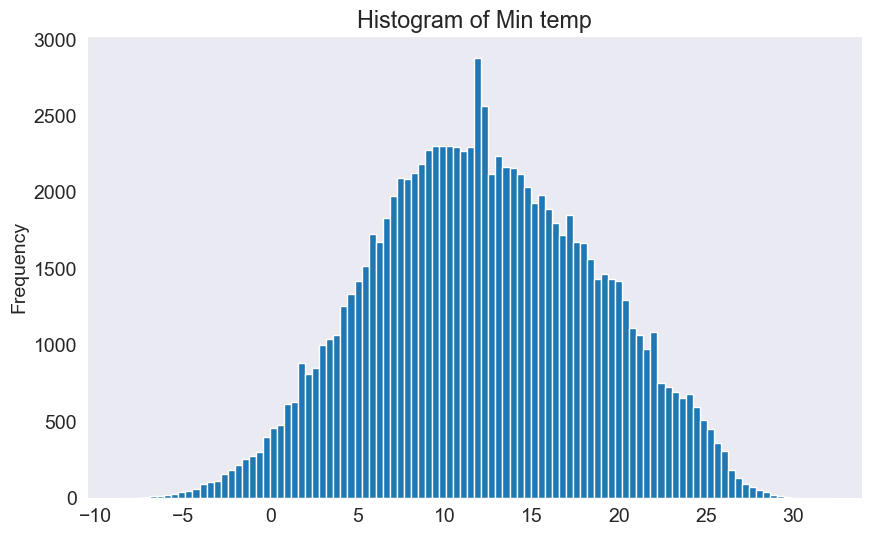

In [36]:
data['MinTemp'].plot(
    kind='hist',
    bins=100,
    
    title='Histogram of Min temp')

In [37]:

px.histogram(data,x='MinTemp', title='Min temp with RainTomorrow', color='RainTomorrow')

In [38]:
px.histogram(data,x='WindDir9am', title='Min temp with RainTomorrow', color='RainTomorrow')

In [39]:

px.histogram(data,x='WindGustDir', title='Min temp with RainTomorrow', color='WindGustDir')

In [40]:

px.scatter(data.sample(2000),
          title='Min Temp vs Max temp',
          x='MinTemp',
          y='MaxTemp',
          color='RainToday')

In [41]:

px.scatter(data.sample(2000),
          title='Min Temp vs Max temp',
          x='Location',
          y='WindDir9am',
          color='RainToday')

In [42]:

px.scatter(data.sample(2000),
          title='Min Temp vs Max temp',
          x='Location',
          y='Evaporation',
          color='RainToday')

In [43]:

px.scatter(data.sample(2000),x='Evaporation', title='Rainfall with RainTomorrow', color='RainTomorrow')

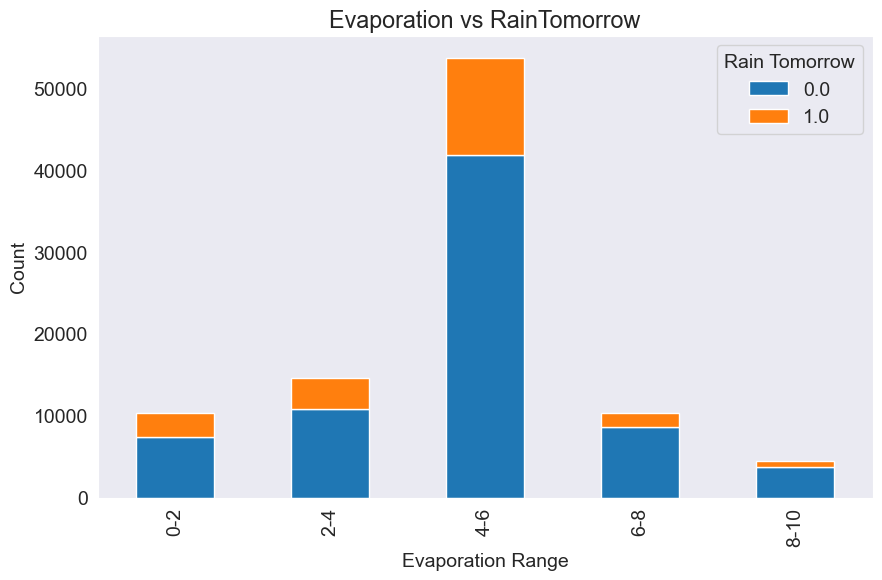

In [44]:
# Define bins for evaporation ranges
bins = [0, 2, 4, 6, 8, 10]

# Add a new column 'EvapRange' to categorize evaporation values
data['Evaporation'] = pd.cut(data['Evaporation'], bins=bins, labels=['0-2', '2-4', '4-6', '6-8', '8-10'])

# Create a cross-tabulation table to count occurrences
cross_tab = pd.crosstab(data['Evaporation'], data['RainTomorrow'])

# Plot the bar plot
cross_tab.plot(kind='bar', stacked=True)
plt.title('Evaporation vs RainTomorrow')
plt.xlabel('Evaporation Range')
plt.ylabel('Count')
plt.legend(title='Rain Tomorrow')

plt.show()

In [45]:

px.scatter(data.sample(2000),x='Sunshine', title='Rainfall with RainTomorrow', color='RainTomorrow')

**will change the RainTomorrow data with 0 - no rain 1- rain**

In [46]:

data['RainTomorrow']= data['RainTomorrow'].replace(['No', 'Yes'], [0, 1])

In [47]:
data['RainToday']= data['RainToday'].replace(['No', 'Yes'], [0, 1])

In [48]:
data.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2013-07-22,Sydney,8.7,17.2,0.0,2-4,9.900000,WNW,54.0,WNW,...,54.0,28.0,1019.4,1016.3,2.000000,2.0000,12.2,16.6,0,0.0
1,2015-02-28,Sale,15.4,25.7,0.0,4-6,7.621306,W,67.0,NNE,...,84.0,66.0,1008.1,1005.1,8.000000,8.0000,18.8,24.3,0,1.0
2,2009-11-18,PerthAirport,15.2,22.2,7.2,4-6,3.300000,NW,78.0,NW,...,68.0,91.0,1001.5,1000.1,7.000000,8.0000,20.1,16.5,1,1.0
3,2014-02-19,Richmond,19.9,26.4,0.0,2-4,7.621306,SW,24.0,NNE,...,97.0,97.0,1004.6,1002.1,4.436289,4.5032,22.6,22.3,0,1.0
4,2015-10-04,Wollongong,19.3,32.9,0.0,4-6,7.621306,W,48.0,NNW,...,46.0,15.0,1022.8,1020.7,4.436289,4.5032,22.1,32.6,0,0.0


**Need to work on Evaporation**

ValueError: could not convert string to float: '4-6'

In [49]:
# Function to preprocess the values
def preprocess_evaporation(value):
    if isinstance(value, str):
        # For range values, split and calculate average
        range_values = value.split('-')
        return (float(range_values[0]) + float(range_values[1])) / 2
    else:
        # For numerical values, return as-is
        return float(value)

# Apply the preprocessing function to the column
data['Evaporation'] = data['Evaporation'].apply(preprocess_evaporation)

In [50]:

data['Evaporation']=data['Evaporation'].astype(float)

In [51]:
mean = data['Evaporation'].mean()
data['Evaporation'].fillna(mean, inplace=True)

In [52]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99522 entries, 0 to 101821
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           99522 non-null  datetime64[ns]
 1   Location       99522 non-null  object        
 2   MinTemp        99522 non-null  float64       
 3   MaxTemp        99522 non-null  float64       
 4   Rainfall       99522 non-null  float64       
 5   Evaporation    99522 non-null  float64       
 6   Sunshine       99522 non-null  float64       
 7   WindGustDir    99522 non-null  object        
 8   WindGustSpeed  99522 non-null  float64       
 9   WindDir9am     99522 non-null  object        
 10  WindDir3pm     99522 non-null  object        
 11  WindSpeed9am   99522 non-null  float64       
 12  WindSpeed3pm   99522 non-null  float64       
 13  Humidity9am    99522 non-null  float64       
 14  Humidity3pm    99522 non-null  float64       
 15  Pressure9am    995

In [53]:
data.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

In [54]:
data[numeric_col].corr()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainTomorrow
MinTemp,1.000000,0.734118,0.102590,0.346225,0.053046,0.174171,0.172672,0.173940,-0.232898,0.005601,-0.422510,-0.433380,0.061240,0.014475,0.898818,0.699970,0.083859
MaxTemp,0.734118,1.000000,-0.078620,0.407637,0.332774,0.068036,0.014571,0.051712,-0.501500,-0.499288,-0.306656,-0.395846,-0.227378,-0.215257,0.881020,0.969120,-0.157120
Rainfall,0.102590,-0.078620,1.000000,-0.035701,-0.170715,0.125914,0.087619,0.056767,0.227451,0.254820,-0.160255,-0.119319,0.174108,0.146990,0.008626,-0.081434,0.242972
Evaporation,0.346225,0.407637,-0.035701,1.000000,0.308365,0.115900,0.088648,0.104502,-0.295412,-0.201511,-0.210083,-0.231760,-0.104757,-0.132416,0.409385,0.392421,-0.075935
Sunshine,0.053046,0.332774,-0.170715,0.308365,1.000000,-0.021314,0.004324,0.039014,-0.352562,-0.447413,0.031557,-0.015652,-0.536784,-0.561926,0.210233,0.350224,-0.328061
WindGustSpeed,0.174171,0.068036,0.125914,0.115900,-0.021314,1.000000,0.576977,0.659870,-0.208275,-0.027190,-0.428336,-0.386862,0.051924,0.080916,0.147179,0.033413,0.224232
WindSpeed9am,0.172672,0.014571,0.087619,0.088648,0.004324,0.576977,1.000000,0.514947,-0.270230,-0.033112,-0.214546,-0.165789,0.019761,0.041261,0.127439,0.004301,0.087703
WindSpeed3pm,0.173940,0.051712,0.056767,0.104502,0.039014,0.659870,0.514947,1.000000,-0.145186,0.014700,-0.278187,-0.241538,0.038536,0.020394,0.162475,0.028724,0.083819
Humidity9am,-0.232898,-0.501500,0.227451,-0.295412,-0.352562,-0.208275,-0.270230,-0.145186,1.000000,0.659507,0.129915,0.175450,0.354064,0.274302,-0.470758,-0.493292,0.253066
Humidity3pm,0.005601,-0.499288,0.254820,-0.201511,-0.447413,-0.027190,-0.033112,0.014700,0.659507,1.000000,-0.026041,0.048863,0.398978,0.407985,-0.216954,-0.555746,0.436959


<Axes: >

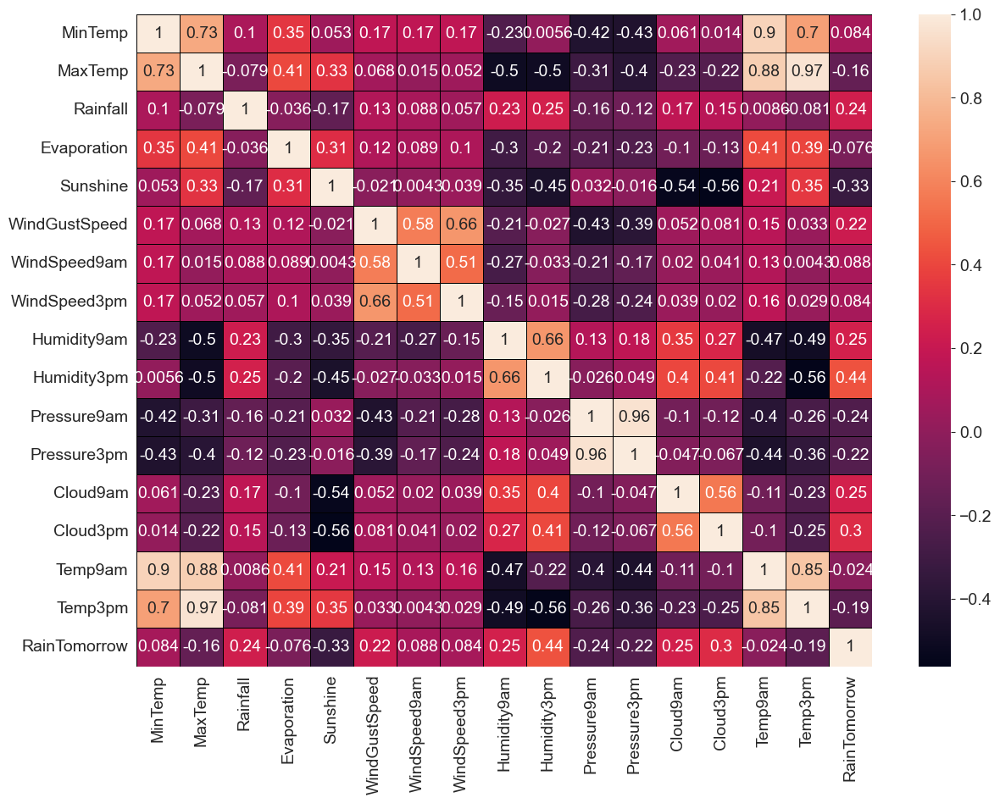

In [55]:
paper=plt.figure(figsize=(14,10))
sns.heatmap(data[numeric_col].corr(), annot=True, fmt='.2g',linewidth=0.5, linecolor='Black')

* The variables 'MinTemp' and 'Temp9am' have a strong positive correlation of 0.898945, which suggests that morning temperatures tend to be higher when the minimum temperatures are higher.
 
* The variables 'Temp9am' and 'Temp3pm' also have a strong positive correlation of 0.848015, which suggests that temperatures tend to rise throughout the day.
 
* The variables 'MaxTemp' and 'Temp3pm' have a strong positive correlation of 0.970337, which suggests that higher maximum temperatures are associated with higher afternoon temperatures.

* The variable 'Rainfall' has a moderate positive correlation with 'RainToday' (0.500997), indicating that higher rainfall tends to be associated with days when it has rained.

In [56]:
# Calculate the correlation matrix
corr_matrix = data[numeric_col].corr()

# Find pairs of features with positive correlation greater than 0.30
high_corr_features = []
for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        correlation = corr_matrix.iloc[i, j]
        if correlation > 0.30:
            high_corr_features.append((corr_matrix.columns[i], corr_matrix.columns[j], correlation))

print("Pairs of features with positive correlation > 0.30:")
for feature1, feature2, correlation in high_corr_features:
    print(f"{feature1} - {feature2}: {correlation}")

Pairs of features with positive correlation > 0.30:
MinTemp - MaxTemp: 0.7341182796194872
MinTemp - Evaporation: 0.3462245157004861
MinTemp - Temp9am: 0.8988184341408378
MinTemp - Temp3pm: 0.6999701427959235
MaxTemp - Evaporation: 0.4076369212332895
MaxTemp - Sunshine: 0.3327742510914575
MaxTemp - Temp9am: 0.881020485239616
MaxTemp - Temp3pm: 0.9691199691858935
Evaporation - Sunshine: 0.3083648169089976
Evaporation - Temp9am: 0.40938500223687
Evaporation - Temp3pm: 0.39242098354049654
Sunshine - Temp3pm: 0.3502240145278082
WindGustSpeed - WindSpeed9am: 0.5769769290005913
WindGustSpeed - WindSpeed3pm: 0.6598704750508065
WindSpeed9am - WindSpeed3pm: 0.514947153048003
Humidity9am - Humidity3pm: 0.6595069677471885
Humidity9am - Cloud9am: 0.35406365398912576
Humidity3pm - Cloud9am: 0.3989780039952126
Humidity3pm - Cloud3pm: 0.4079845427089276
Humidity3pm - RainTomorrow: 0.43695911738286003
Pressure9am - Pressure3pm: 0.9600517106135753
Cloud9am - Cloud3pm: 0.5605505282947857
Cloud3pm - RainT

In [57]:
# Create a scatter plot using Plotly Express
scatter_plot = px.scatter(data.sample(2000), x='Temp3pm', y='Temp9am', 
                              color='RainToday',  
                          title='Scatter Plot of Temperature')

# Show the scatter plot
scatter_plot.show()

In [58]:
# Create a scatter plot using Plotly Express
scatter_plot = px.scatter(data.sample(2000), x='Rainfall', y='RainToday', 
                          color='RainTomorrow',  
                          title='Scatter Plot of Temperature')

# Show the scatter plot
scatter_plot.show()

# Training Validation and Test Sets

While building the real-world machine learning models, it is quite common to split the dataset in three parts here we are creating 3 dataset from the original dataset

1. Training Set Used to train a model i.e compute the loss and adjust the models weights using an optimization technique

2. Validation Set Used to evaluate the model during training, tune model hyperparameters (Optimization techniuqe regularization etc) and pick the best version of the model. picking a good validation set is essential for training models that generalize well

3. Test Set Used to compare different models or approaches and report the models final accuracy. For many datasets test sets are provided seperatly. the test set should reflect the kind of data the model will encounter in the real world as closely as feasible

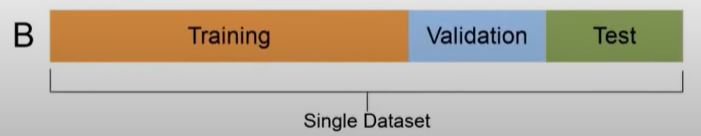

4. As a genral rule of thumb you can use around 60% of the data for the training test , 20 % for the validation set and 20% for test set, if seperate test set is already provided, you can use a 75% - 25% training validation split


# Backup 2.0

In [59]:
data.to_csv('WeatherUpdated.csv')

backup=pd.DataFrame(data)
backup.sample()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
77157,2011-01-04,Sydney,17.3,22.6,3.0,5.0,1.9,SSE,35.0,SSW,...,74.0,60.0,1014.1,1011.6,4.436289,4.5032,20.1,21.8,1,0.0


# Identifying input and target columns
often, not all the columns in dataset are useful for training a model. In the current dataset, we can ignore the Date column, since we only want to weather conditions to make a prediction about weather it will rain the next day

In [60]:
data=pd.read_csv('WeatherUpdated.csv')

In [61]:
data.isnull().sum()

Unnamed: 0       0
Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

# OneHotEncoder for Cat columns

In [62]:
data=data.drop('Unnamed: 0', axis=1)

In [63]:
cate_col= ['Location',
 'WindGustDir',
 'WindDir9am',
 'WindDir3pm',]

In [64]:
data[cate_col]

,Location,WindGustDir,WindDir9am,WindDir3pm
0,Sydney,WNW,WNW,W
1,Sale,W,NNE,WSW
2,PerthAirport,NW,NW,WSW
3,Richmond,SW,NNE,WSW
4,Wollongong,W,NNW,W
...,...,...,...,...
99517,Walpole,NNW,NNW,NNW
99518,PerthAirport,ENE,NE,WNW
99519,Newcastle,Unknown,Unknown,Unknown
99520,Richmond,S,SSW,SSW


In [65]:
data[cate_col].isnull().sum()

Location       0
WindGustDir    0
WindDir9am     0
WindDir3pm     0
dtype: int64

In [66]:

from sklearn.preprocessing import OneHotEncoder

In [67]:

encoder= OneHotEncoder(sparse=False, handle_unknown ='ignore' )

In [68]:

encoder.fit(data[cate_col])

C:\Anaconda\Lib\site-packages\sklearn\preprocessing\_encoders.py:972: FutureWarning:

`sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.



OneHotEncoder(handle_unknown='ignore', sparse=False, sparse_output=False)

In [69]:
encoder.categories_

[array(['Adelaide', 'Albany', 'Albury', 'AliceSprings', 'BadgerysCreek',
        'Ballarat', 'Bendigo', 'Brisbane', 'Cairns', 'Canberra', 'Cobar',
        'CoffsHarbour', 'Dartmoor', 'Darwin', 'GoldCoast', 'Hobart',
        'Katherine', 'Launceston', 'Melbourne', 'MelbourneAirport',
        'Mildura', 'Moree', 'MountGambier', 'MountGinini', 'Newcastle',
        'Nhil', 'NorahHead', 'NorfolkIsland', 'Nuriootpa', 'PearceRAAF',
        'Penrith', 'Perth', 'PerthAirport', 'Portland', 'Richmond', 'Sale',
        'SalmonGums', 'Sydney', 'SydneyAirport', 'Townsville',
        'Tuggeranong', 'Uluru', 'WaggaWagga', 'Walpole', 'Watsonia',
        'Williamtown', 'Witchcliffe', 'Wollongong', 'Woomera'],
       dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'Unknown', 'W', 'WNW', 'WSW'], dtype=object),
 array(['E', 'ENE', 'ESE', 'N', 'NE', 'NNE', 'NNW', 'NW', 'S', 'SE', 'SSE',
        'SSW', 'SW', 'Unknown', 'W', 'WNW', 'WSW'], dtype=

In [70]:
encoded_cols=list(encoder.get_feature_names_out(cate_col))
print(encoded_cols)



['Location_Adelaide', 'Location_Albany', 'Location_Albury', 'Location_AliceSprings', 'Location_BadgerysCreek', 'Location_Ballarat', 'Location_Bendigo', 'Location_Brisbane', 'Location_Cairns', 'Location_Canberra', 'Location_Cobar', 'Location_CoffsHarbour', 'Location_Dartmoor', 'Location_Darwin', 'Location_GoldCoast', 'Location_Hobart', 'Location_Katherine', 'Location_Launceston', 'Location_Melbourne', 'Location_MelbourneAirport', 'Location_Mildura', 'Location_Moree', 'Location_MountGambier', 'Location_MountGinini', 'Location_Newcastle', 'Location_Nhil', 'Location_NorahHead', 'Location_NorfolkIsland', 'Location_Nuriootpa', 'Location_PearceRAAF', 'Location_Penrith', 'Location_Perth', 'Location_PerthAirport', 'Location_Portland', 'Location_Richmond', 'Location_Sale', 'Location_SalmonGums', 'Location_Sydney', 'Location_SydneyAirport', 'Location_Townsville', 'Location_Tuggeranong', 'Location_Uluru', 'Location_WaggaWagga', 'Location_Walpole', 'Location_Watsonia', 'Location_Williamtown', 'Loca

In [71]:
data.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

In [72]:
data[encoded_cols] = encoder.transform(data[cate_col])

C:\Users\МАКСИМ\AppData\Local\Temp\ipykernel_8788\3382264401.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\МАКСИМ\AppData\Local\Temp\ipykernel_8788\3382264401.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\МАКСИМ\AppData\Local\Temp\ipykernel_8788\3382264401.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented 

In [73]:

pd.set_option('display.max_columns', None)

In [74]:

data.shape

(99522, 123)

In [75]:

data=data.drop(columns=(cate_col))

In [76]:

data.shape

(99522, 119)

In [77]:
data = data.reset_index(drop=True)

In [78]:
data.head()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_Unknown,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_Unknown,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,2013-07-22,8.7,17.2,0.0,3.0,9.900000,54.0,17.0,26.0,54.0,28.0,1019.4,1016.3,2.000000,2.0000,12.2,16.6,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
1,2015-02-28,15.4,25.7,0.0,5.0,7.621306,67.0,11.0,9.0,84.0,66.0,1008.1,1005.1,8.000000,8.0000,18.8,24.3,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,2009-11-18,15.2,22.2,7.2,5.0,3.300000,78.0,33.0,28.0,68.0,91.0,1001.5,1000.1,7.000000,8.0000,20.1,16.5,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,2014-02-19,19.9,26.4,0.0,3.0,7.621306,24.0,13.0,9.0,97.0,97.0,1004.6,1002.1,4.436289,4.5032,22.6,22.3,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,2015-10-04,19.3,32.9,0.0,5.0,7.621306,48.0,19.0,22.0,46.0,15.0,1022.8,1020.7,4.436289,4.

# Train Test Split using using sklearn

In [79]:
from sklearn.model_selection import train_test_split

**Here we have split data between train_val_df= 80% and test_df=20%**

In [80]:
train_val_df, test_df = train_test_split(data, test_size = 0.2, random_state=42)

**Here we have split data between train_val_df= 80% and test_df=20%**

In [81]:
train_df, val_df = train_test_split(train_val_df, test_size = 0.25, random_state=42)

In [82]:
print("test_df",test_df.shape)
print("train_df",train_df.shape)
print("val_df",val_df.shape)

test_df (19905, 119)
train_df (59712, 119)
val_df (19905, 119)


here again from the Train_val_df =80% we have splited for val_df25% and 75 % will be train_df

now we have below data

* test_df = 25% of all data
* train_df = 75 % of all data
* val_df = 25 % of all data

* However, while working with dates, its often a better idea to seperate the training, validation, and test sets with time so that the model is trained on data from the past and evaluated on data from the future

* For current dataset we can use the Data column in the dataset to create anather column for year well pick the last two years for the test set and one year before it for validation set

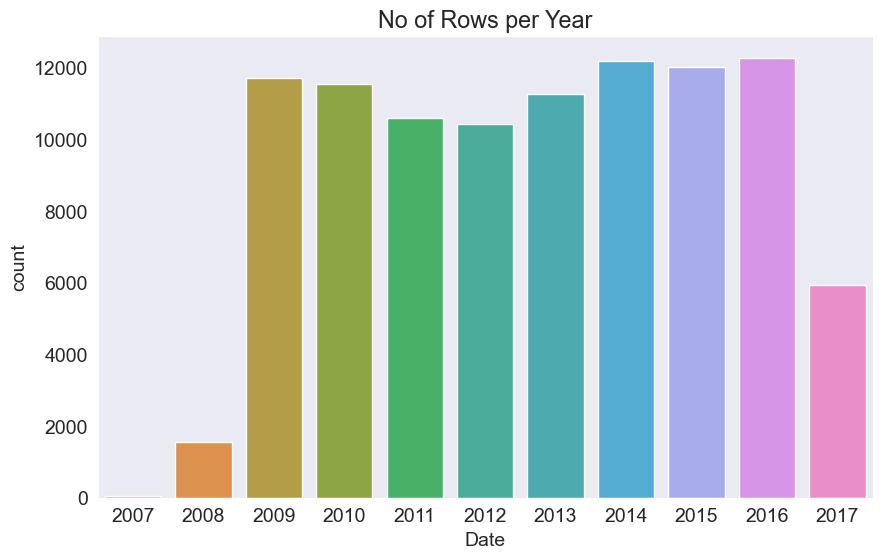

In [83]:
data['Date'] = pd.to_datetime(data['Date'])
plt.title('No of Rows per Year')
sns.countplot(x=data['Date'].dt.year)
plt.show()

In [84]:
year=data['Date'].dt.year
train_df = data[year < 2015]
val_df = data[year == 2015]
test_df = data[year > 2015]

In [85]:
print("test_df",test_df.shape)
print("train_df",train_df.shape)
print("val_df",val_df.shape)

test_df (18195, 119)
train_df (69317, 119)
val_df (12010, 119)


**Now we dont require the Date column so we can drop the date column from all 3 sets**

In [86]:
train_df=train_df.drop(columns='Date')
val_df=val_df.drop(columns='Date')
test_df=test_df.drop(columns='Date')

In [87]:
print("test_df",test_df.shape)
print("train_df",train_df.shape)
print("val_df",val_df.shape)
train_df.head()

test_df (18195, 118)
train_df (69317, 118)
val_df (12010, 118)


,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_Unknown,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_Unknown,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,8.7,17.2,0.0,3.0,9.900000,54.0,17.0,26.0,54.0,28.0,1019.4,1016.3,2.000000,2.0000,12.2,16.6,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,15.2,22.2,7.2,5.0,3.300000,78.0,33.0,28.0,68.0,91.0,1001.5,1000.1,7.000000,8.0000,20.1,16.5,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,19.9,26.4,0.0,3.0,7.621306,24.0,13.0,9.0,97.0,97.0,1004.6,1002.1,4.436289,4.5032,22.6,22.3,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,-0.3,14.2,0.0,3.0,9.700000,43.0,13.0,28.0,67.0,50.0,1019.0,1015.5,2.000000,0.0000,9.2,13.7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,12.3,19.5,2.2,5.0,7.621306,46.0,19.0,19.0,28.0,38.0,1017.5,1018.1,4.436289,4.5032,16.4,18.5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

In [88]:
# train_df=train_df.drop(columns='RainTomorrow')
# val_df=val_df.drop(columns='RainTomorrow')
# test_df=test_df.drop(columns='RainTomorrow')

In [89]:

train_df.head()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_Unknown,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_Unknown,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,8.7,17.2,0.0,3.0,9.900000,54.0,17.0,26.0,54.0,28.0,1019.4,1016.3,2.000000,2.0000,12.2,16.6,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
2,15.2,22.2,7.2,5.0,3.300000,78.0,33.0,28.0,68.0,91.0,1001.5,1000.1,7.000000,8.0000,20.1,16.5,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
3,19.9,26.4,0.0,3.0,7.621306,24.0,13.0,9.0,97.0,97.0,1004.6,1002.1,4.436289,4.5032,22.6,22.3,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
6,-0.3,14.2,0.0,3.0,9.700000,43.0,13.0,28.0,67.0,50.0,1019.0,1015.5,2.000000,0.0000,9.2,13.7,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9,12.3,19.5,2.2,5.0,7.621306,46.0,19.0,19.0,28.0,38.0,1017.5,1018.1,4.436289,4.5032,16.4,18.5,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0

# Seperate out the Input/Independant or Traget/Dependant columns

In [90]:

print(train_df.columns)

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm',
       ...
       'WindDir3pm_NW', 'WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE',
       'WindDir3pm_SSW', 'WindDir3pm_SW', 'WindDir3pm_Unknown', 'WindDir3pm_W',
       'WindDir3pm_WNW', 'WindDir3pm_WSW'],
      dtype='object', length=118)


In [91]:
backup1=data.copy()

In [92]:

input_col=data.columns[~data.columns.isin(['Date', 'RainTomorrow'])]
data[input_col].head(1)

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,Location_Adelaide,Location_Albany,Location_Albury,Location_AliceSprings,Location_BadgerysCreek,Location_Ballarat,Location_Bendigo,Location_Brisbane,Location_Cairns,Location_Canberra,Location_Cobar,Location_CoffsHarbour,Location_Dartmoor,Location_Darwin,Location_GoldCoast,Location_Hobart,Location_Katherine,Location_Launceston,Location_Melbourne,Location_MelbourneAirport,Location_Mildura,Location_Moree,Location_MountGambier,Location_MountGinini,Location_Newcastle,Location_Nhil,Location_NorahHead,Location_NorfolkIsland,Location_Nuriootpa,Location_PearceRAAF,Location_Penrith,Location_Perth,Location_PerthAirport,Location_Portland,Location_Richmond,Location_Sale,Location_SalmonGums,Location_Sydney,Location_SydneyAirport,Location_Townsville,Location_Tuggeranong,Location_Uluru,Location_WaggaWagga,Location_Walpole,Location_Watsonia,Location_Williamtown,Location_Witchcliffe,Location_Wollongong,Location_Woomera,WindGustDir_E,WindGustDir_ENE,WindGustDir_ESE,WindGustDir_N,WindGustDir_NE,WindGustDir_NNE,WindGustDir_NNW,WindGustDir_NW,WindGustDir_S,WindGustDir_SE,WindGustDir_SSE,WindGustDir_SSW,WindGustDir_SW,WindGustDir_Unknown,WindGustDir_W,WindGustDir_WNW,WindGustDir_WSW,WindDir9am_E,WindDir9am_ENE,WindDir9am_ESE,WindDir9am_N,WindDir9am_NE,WindDir9am_NNE,WindDir9am_NNW,WindDir9am_NW,WindDir9am_S,WindDir9am_SE,WindDir9am_SSE,WindDir9am_SSW,WindDir9am_SW,WindDir9am_Unknown,WindDir9am_W,WindDir9am_WNW,WindDir9am_WSW,WindDir3pm_E,WindDir3pm_ENE,WindDir3pm_ESE,WindDir3pm_N,WindDir3pm_NE,WindDir3pm_NNE,WindDir3pm_NNW,WindDir3pm_NW,WindDir3pm_S,WindDir3pm_SE,WindDir3pm_SSE,WindDir3pm_SSW,WindDir3pm_SW,WindDir3pm_Unknown,WindDir3pm_W,WindDir3pm_WNW,WindDir3pm_WSW
0,8.7,17.2,0.0,3.0,9.9,54.0,17.0,26.0,54.0,28.0,1019.4,1016.3,2.0,2.0,12.2,16.6,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


# we have removed Date column and RainTomorrow (Target ) Columns

In [93]:
target_col = 'RainTomorrow'
target_col

'RainTomorrow'

In [94]:
print(input_col)
print("\n---------------------------------------------------------------")
print(target_col)

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm',
       ...
       'WindDir3pm_NW', 'WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE',
       'WindDir3pm_SSW', 'WindDir3pm_SW', 'WindDir3pm_Unknown', 'WindDir3pm_W',
       'WindDir3pm_WNW', 'WindDir3pm_WSW'],
      dtype='object', length=117)

---------------------------------------------------------------
RainTomorrow


# will add the inpute and target column data in to our train validate , test sets

In [95]:
print("test_df",test_df.shape)
print("train_df",train_df.shape)
print("val_df",val_df.shape)

test_df (18195, 118)
train_df (69317, 118)
val_df (12010, 118)


In [96]:

train_inputs = train_df[input_col].copy()
train_targets = train_df[target_col].copy()

In [97]:

val_inputs = val_df[input_col].copy()
val_targets = val_df[target_col].copy()


In [98]:
test_inputs = test_df[input_col].copy()
test_targets = test_df[target_col].copy()

In [99]:
print("train_inputs",train_inputs.shape)
print("train_targets",train_targets.shape)
print("val_inputs",val_inputs.shape)
print("val_targets",val_targets.shape)
print("test_inputs",test_inputs.shape)
print("test_targets",test_targets.shape)

train_inputs (69317, 117)
train_targets (69317,)
val_inputs (12010, 117)
val_targets (12010,)
test_inputs (18195, 117)
test_targets (18195,)


# Train The Logistic Regression Model

In [100]:

from sklearn.linear_model import LogisticRegression

In [101]:

model=LogisticRegression(solver='liblinear')

In [102]:

model.fit(train_inputs,train_targets)

LogisticRegression(solver='liblinear')

In [103]:

model_coef=model.coef_

In [104]:

reshaped_array = model_coef.reshape(-1, 1)
reshaped_array

array([[ 0.02236803],
       [-0.04528586],
       [ 0.01320885],
       [ 0.0327037 ],
       [-0.12136086],
       [ 0.05888298],
       [-0.00981757],
       [-0.01971344],
       [ 0.00385185],
       [ 0.05770609],
       [ 0.14102983],
       [-0.14861804],
       [-0.02115535],
       [ 0.14419671],
       [ 0.02424359],
       [ 0.03454311],
       [ 0.5651868 ],
       [ 0.32424319],
       [-0.08115924],
       [ 0.31355197],
       [ 0.04028315],
       [ 0.2012031 ],
       [-0.11944798],
       [ 0.15203342],
       [ 0.27717453],
       [ 0.03153079],
       [ 0.04683236],
       [ 0.1362167 ],
       [ 0.03363   ],
       [ 0.08301713],
       [-0.16655196],
       [-0.0927646 ],
       [-0.15444047],
       [-0.17415951],
       [ 0.01991859],
       [-0.20615729],
       [-0.29924011],
       [ 0.04953882],
       [-0.02168802],
       [ 0.09397731],
       [-0.47628585],
       [-0.11483386],
       [ 0.01881605],
       [-0.33138158],
       [-0.25675252],
       [-0

In [105]:

train_input_col_coef=train_inputs.columns
train_input_col_coef

Index(['MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine',
       'WindGustSpeed', 'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am',
       'Humidity3pm',
       ...
       'WindDir3pm_NW', 'WindDir3pm_S', 'WindDir3pm_SE', 'WindDir3pm_SSE',
       'WindDir3pm_SSW', 'WindDir3pm_SW', 'WindDir3pm_Unknown', 'WindDir3pm_W',
       'WindDir3pm_WNW', 'WindDir3pm_WSW'],
      dtype='object', length=117)

In [106]:
coef_df=pd.DataFrame(train_input_col_coef)
coef_df['model_coef']= reshaped_array

<Figure size 1000x5000 with 0 Axes>

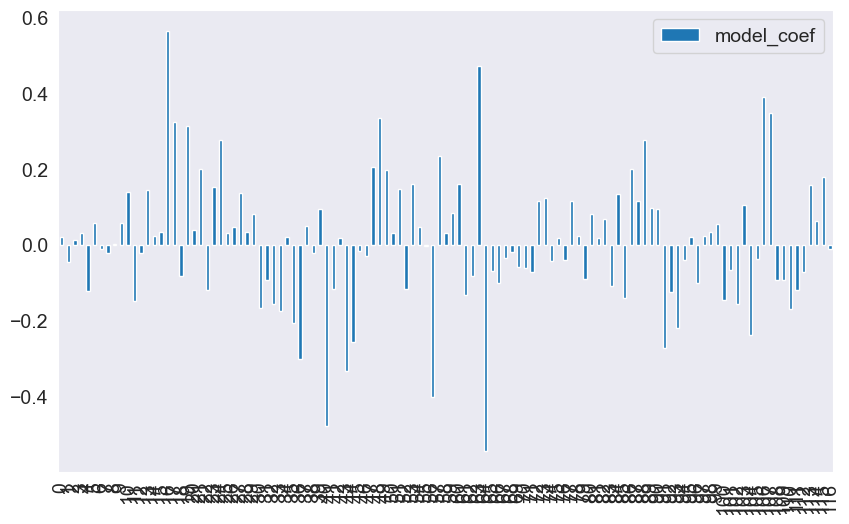

In [107]:
paper=plt.figure(figsize=(10,50))
coef_df.plot(kind='bar')
plt.xticks(rotation=90)
plt.show()

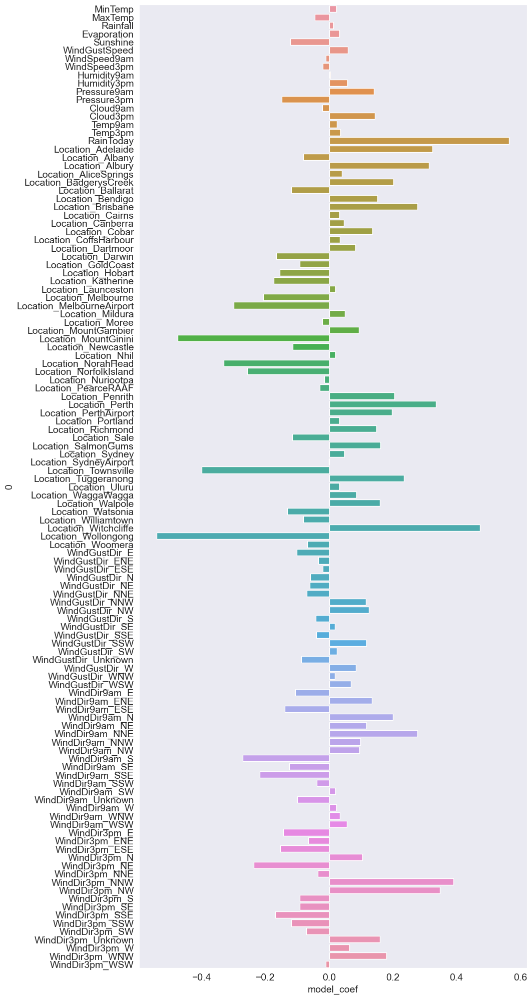

In [108]:

paper=plt.figure(figsize=(10,25))
sns.barplot(data=coef_df,x='model_coef', y=coef_df[0])
#plt.xticks(rotation=90)
plt.show()

In [109]:

top_20_Model_coef=coef_df.sort_values('model_coef',ascending=False).head(20)

In [110]:

top_20_Model_coef.reset_index(drop=True)

,0,model_coef
0,RainToday,0.565187
1,Location_Witchcliffe,0.472963
2,WindDir3pm_NNW,0.389723
3,WindDir3pm_NW,0.347955
4,Location_Perth,0.335835
5,Location_Adelaide,0.324243
6,Location_Albury,0.313552
7,Location_Brisbane,0.277175
8,WindDir9am_NNE,0.276963
9,Location_Tuggeranong,0.234355


In [111]:

top_20_Model_coef['feature_coef']=top_20_Model_coef[0]

In [112]:

top_20_Model_coef

,0,model_coef,feature_coef
16,RainToday,0.565187,RainToday
63,Location_Witchcliffe,0.472963,Location_Witchcliffe
106,WindDir3pm_NNW,0.389723,WindDir3pm_NNW
107,WindDir3pm_NW,0.347955,WindDir3pm_NW
48,Location_Perth,0.335835,Location_Perth
17,Location_Adelaide,0.324243,Location_Adelaide
19,Location_Albury,0.313552,Location_Albury
24,Location_Brisbane,0.277175,Location_Brisbane
88,WindDir9am_NNE,0.276963,WindDir9am_NNE
57,Location_Tuggeranong,0.234355,Location_Tuggeranong


In [113]:
px.bar(top_20_Model_coef,x='model_coef',y='feature_coef', title='TOP 20 Model Coef with features')

In [114]:
model_intercepts=model.intercept_
model_intercepts

array([0.05311007])

In [115]:
train_predict=model.predict(train_inputs)

In [116]:

train_predict

array([0., 1., 1., ..., 0., 1., 0.])

In [117]:

train_targets

0        0.0
2        1.0
3        1.0
6        0.0
9        0.0
        ... 
99514    1.0
99515    0.0
99516    0.0
99520    1.0
99521    0.0
Name: RainTomorrow, Length: 69317, dtype: float64

# check the probability

# Explanation of model.predict_proba Method

The model.predict_proba method is a function provided by many classification machine learning models, particularly those in the scikit-learn library. It is used to predict the probability estimates of class membership for each sample input.

In a classification problem, a machine learning model predicts the class label for a given input. However, in addition to predicting the class label itself, it's often useful to know the likelihood or probability of a sample belonging to each possible class. This is where predict_proba comes into play.

# How It Works

When you call model.predict_proba(X), where X is the input data (features), the method computes the probability estimates for each class that the input samples may belong to. These probabilities are typically in the range [0, 1], and they sum up to 1 for each sample.

For example, if you have a binary classification problem with two classes ('class A' and 'class B'), the predict_proba method might return probabilities like [0.3, 0.7] for a given input sample. This indicates a 30% probability that the sample belongs to 'class A' and a 70% probability that it belongs to 'class B'.

# Use Cases

**Thresholding:** The probability estimates can be used to set decision thresholds for making predictions. For instance, you can predict 'class A' if the probability estimate is above 0.5, and 'class B' otherwise.

**Ranking:** The probabilities can be used to rank predicted classes. Higher probabilities generally indicate stronger model confidence.

**Uncertainty Estimation:** In some cases, a lower probability estimate might indicate higher uncertainty, allowing you to handle uncertain predictions more cautiously.

# Notes

* The predict_proba method is available for models that support probability estimates, such as logistic regression, random forests, and gradient boosting classifiers.
 
* The sum of predicted probabilities for each sample will always be 1, as each sample belongs to exactly one class.

* Some models might use different methods to compute these probabilities, including Platt scaling and Isotonic regression.

In summary, model.predict_proba provides valuable information beyond just the predicted class labels, allowing you to make more informed decisions based on the likelihood of class membership.

In [118]:
train_probs=model.predict_proba(train_inputs)
print(model.classes_)
train_probs

[0. 1.]


array([[0.96462925, 0.03537075],
       [0.01600763, 0.98399237],
       [0.35060896, 0.64939104],
       ...,
       [0.96908177, 0.03091823],
       [0.42183683, 0.57816317],
       [0.9134145 , 0.0865855 ]])

In [119]:

No_probs=train_probs[:,0]
Yes_probs=train_probs[:,1]
model_probs=pd.DataFrame({'No_probs':No_probs,'Yes_probs':Yes_probs})
model_probs

,No_probs,Yes_probs
0,0.964629,0.035371
1,0.016008,0.983992
2,0.350609,0.649391
3,0.930339,0.069661
4,0.956135,0.043865
...,...,...
69312,0.032910,0.967090
69313,0.980958,0.019042
69314,0.969082,0.030918
69315,0.421837,0.578163


In [120]:
px.histogram(model_probs.head(100),x='No_probs', title='Min temp with RainTomorrow', y='Yes_probs')

In [121]:
train_probs=train_probs.astype(str)

In [122]:

train_probs=pd.DataFrame(train_probs)
train_probs

,0,1
0,0.9646292501476951,0.035370749852304935
1,0.01600763361362545,0.9839923663863746
2,0.35060896102557004,0.64939103897443
3,0.9303394897856002,0.06966051021439977
4,0.956134505449698,0.04386549455030199
...,...,...
69312,0.0329101448582767,0.9670898551417233
69313,0.9809579681145708,0.01904203188542921
69314,0.9690817687508437,0.030918231249156315
69315,0.42183682552040036,0.5781631744795996


# Acurrecy Model

In [123]:

from sklearn.metrics import accuracy_score

In [124]:
accurecy_scr=accuracy_score(train_targets,train_predict)
print("Accurecy Score : {:.2f} %".format((accurecy_scr*100)))

Accurecy Score : 85.04 %


# Confusion Metrics

**The Model achives an accurecy of 85.06% on the training set. we can visualize the breakdown of correctly and incorrectly classified inputs using confusion matrics**

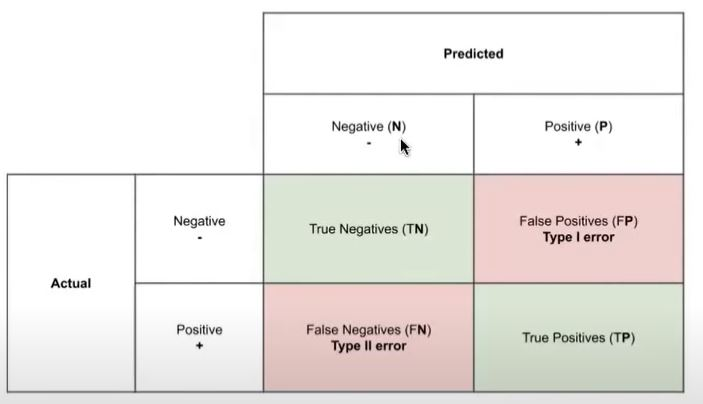

In [125]:
from sklearn.metrics import confusion_matrix

In [126]:
confusion_mat_values=confusion_matrix(train_targets,train_predict,normalize='true')
confusion_mat_values

array([[0.94766034, 0.05233966],
       [0.49507486, 0.50492514]])

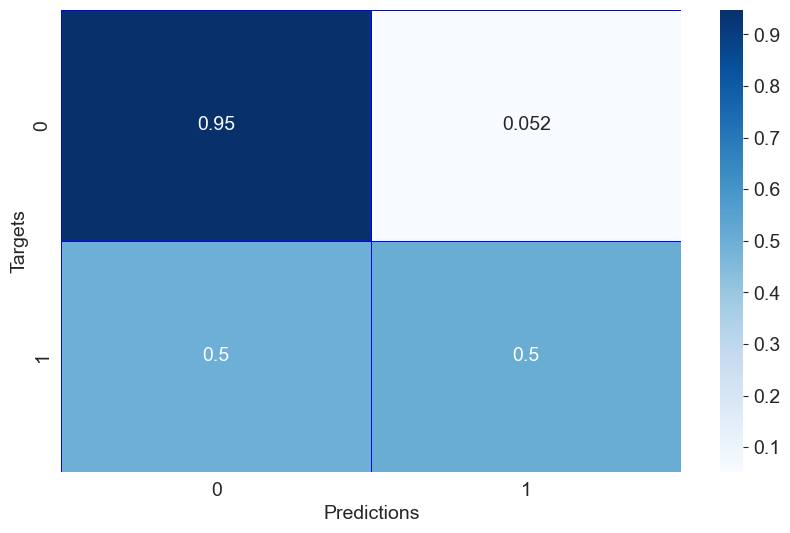

In [127]:
sns.heatmap(confusion_mat_values, annot=True, linewidth=0.5, linecolor='Blue',cmap='Blues')
plt.xlabel("Predictions")
plt.ylabel("Targets")
plt.show()

# Interpreting Confusion Matrix Values

A confusion matrix is a useful tool to assess the performance of a classification model. It provides insights into how well the model's predictions align with the actual class labels. Given the confusion matrix values:

[[0.94579341, 0.05420659],

 [0.4820167 , 0.5179833 ]]
 
Let's break down the important points:

# 1. Rows and Columns

The confusion matrix is organized into rows and columns, where each cell represents a specific combination of predicted and actual class labels.

# 2. Classes
In a binary classification scenario, the classes are often labeled as "positive" and "negative". These labels determine the arrangement of values in the matrix.

# 3. True Positives (TP) and True Negatives (TN)

The value in the top-left corner (0.94579341) represents the True Positive (TP) rate. This indicates the percentage of instances that were correctly classified as the positive class.

The value in the bottom-right corner (0.5179833) is the True Negative (TN) rate. This represents the percentage of instances correctly classified as the negative class.

The top-left value (0.94579341) indicates a high True Positive rate. This suggests that the model is effective at correctly classifying instances that belong to the positive class.

The bottom-right value (0.5179833) represents a moderate True Negative rate. The model is also capable of correctly identifying instances that belong to the negative class.

# 4. False Positives (FP) and False Negatives (FN)

The value in the top-right corner (0.05420659) is the False Positive (FP) rate. It represents the percentage of instances that were incorrectly classified as the positive class when they actually belong to the negative class.

The value in the bottom-left corner (0.4820167) is the False Negative (FN) rate. This represents the percentage of instances that were incorrectly classified as the negative class when they actually belong to the positive class.

The top-right value (0.05420659) reflects a low False Positive rate. The model incorrectly classifies only a small percentage of instances as positive when they are actually negative.

The bottom-left value (0.4820167) indicates a moderate False Negative rate. The model tends to miss some instances that belong to the positive class and incorrectly classifies them as negative.

# 5. Accuracy

Accuracy is a common metric derived from the confusion matrix. It calculates the proportion of correct predictions (both TP and TN) out of the total number of instances.

# 6. Precision and Recall

Precision (also known as Positive Predictive Value) measures the proportion of true positive predictions out of all positive predictions. It's a measure of the model's ability to avoid false positives.

Recall (also known as Sensitivity or True Positive Rate) measures the proportion of true positive predictions out of all actual positive instances. It's a measure of the model's ability to capture positive instances.

# 7. F1-Score

The F1-Score is the harmonic mean of precision and recall. It provides a balanced measure of a model's accuracy when dealing with imbalanced classes.
Understanding these values helps assess the strengths and weaknesses of the classification model and guides decisions on tuning the model or adjusting decision thresholds.

# Lets Predict the data on Validation set

In [128]:
val_predict=model.predict(val_inputs)
val_predict

array([1., 0., 0., ..., 0., 1., 0.])

In [129]:
val_targets

1        1.0
4        0.0
5        0.0
25       0.0
27       0.0
        ... 
99491    0.0
99500    0.0
99512    0.0
99517    1.0
99518    0.0
Name: RainTomorrow, Length: 12010, dtype: float64

In [130]:

accurecy_scr_val_set=accuracy_score(val_targets,val_predict)
print("Accurecy Score : {:.2f} %".format((accurecy_scr*100)))

Accurecy Score : 85.04 %


In [131]:
confusion_mat_val_set=confusion_matrix(val_targets,val_predict,normalize='true')
confusion_mat_val_set

array([[0.95510934, 0.04489066],
       [0.54283427, 0.45716573]])

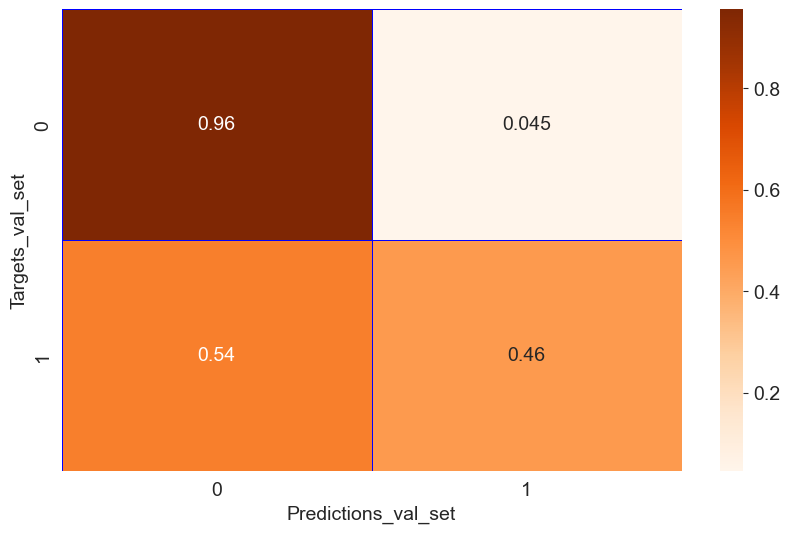

In [132]:
sns.heatmap(confusion_mat_val_set, annot=True, linewidth=0.5, linecolor='Blue',cmap='Oranges')
plt.xlabel("Predictions_val_set")
plt.ylabel("Targets_val_set")
plt.show()

# Lets Predict the data on Test set

In [133]:

test_predict=model.predict(test_inputs)
test_predict

array([0., 0., 0., ..., 1., 0., 1.])

In [134]:
accurecy_scr_test_set=accuracy_score(test_targets,test_predict)
print("Accurecy Score : {:.2f} %".format((accurecy_scr*100)))

Accurecy Score : 85.04 %


In [135]:

confusion_mat_test_set=confusion_matrix(test_targets,test_predict,normalize='true')
confusion_mat_test_set

array([[0.94873431, 0.05126569],
       [0.52932551, 0.47067449]])

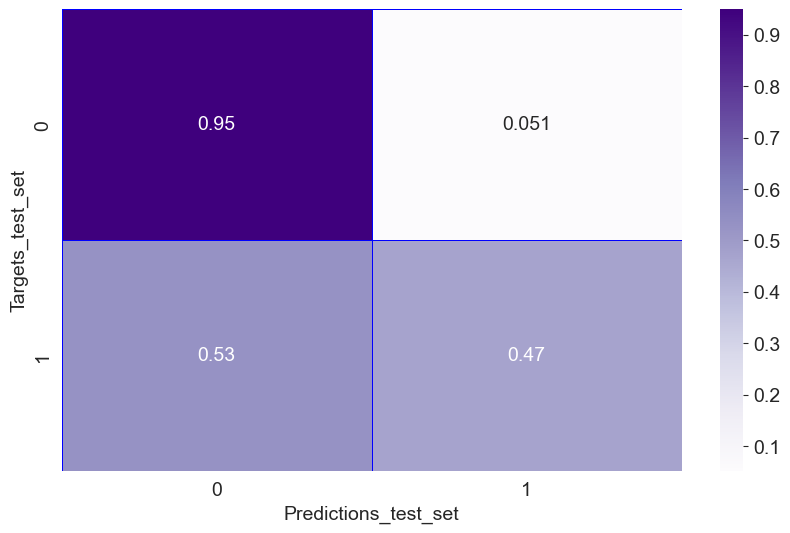

In [136]:

sns.heatmap(confusion_mat_test_set, annot=True, linewidth=0.5, linecolor='Blue',cmap='Purples')
plt.xlabel("Predictions_test_set")
plt.ylabel("Targets_test_set")
plt.show()